In [40]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [41]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [19]:
import pandas as pd
import numpy as np
import yfinance as yf

In [4]:
# 데이터 다운로드
df_yahoo = yf.download('AAPL',
                      start = '2000-01-01',
                      end = '2010-12-31',
                      progress=False)

In [5]:
df_yahoo

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1999-12-31,0.901228,0.918527,0.888393,0.917969,0.790705,163811200
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.860883,535796800
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.788302,512377600
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.799837,778321600
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.730621,767972800
...,...,...,...,...,...,...
2010-12-23,11.607143,11.612500,11.541786,11.557143,9.954899,223157200
2010-12-27,11.530357,11.622857,11.482857,11.595714,9.988124,249816000
2010-12-28,11.639643,11.666429,11.609286,11.623929,10.012430,175924000


Quandle API = 5rVyyK5Tysrsx3RgHdYx

In [7]:
import quandl

In [13]:
QUANDL_KEY = '5rVyyK5Tysrsx3RgHdYx'
quandl.ApiConfig.api_key = QUANDL_KEY

In [14]:
df_quandl = quandl.get(dataset = 'WIKI/AAPL',
                      start_date = '2000-01-01',
                      end_date = '2010-12-31')

In [15]:
df_quandl

,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
2000-01-03,104.8700,112.50,101.69,111.94,4783900.0,0.0,1.0,3.369314,3.614454,3.267146,3.596463,133949200.0
2000-01-04,108.2500,110.62,101.19,102.50,4574800.0,0.0,1.0,3.477908,3.554053,3.251081,3.293170,128094400.0
2000-01-05,103.7500,110.56,103.00,104.00,6949300.0,0.0,1.0,3.333330,3.552125,3.309234,3.341362,194580400.0
2000-01-06,106.1200,107.00,95.00,95.00,6856900.0,0.0,1.0,3.409475,3.437748,3.052206,3.052206,191993200.0
2000-01-07,96.5000,101.00,95.50,99.50,4113700.0,0.0,1.0,3.100399,3.244977,3.068270,3.196784,115183600.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2010-12-27,322.8519,325.44,321.52,324.68,8922000.0,0.0,1.0,41.490969,41.823576,41.319801,41.725905,62454000.0
2010-12-28,325.9102,326.66,325.06,325.47,6283000.0,0.0,1.0,41.884003,41.980363,41.774741,41.827431,43981000.0
2010-12-29,326.2200,326.45,325.10,325.29,5826400.0,0.0,1.0,41.923817,41.953375,41.779881,41.804299,40784800.0


주가를 수익률로 바꾸기

In [45]:
df = yf.download('AAPL',
                      start = '2000-01-01',
                      end = '2010-12-31',
                      progress=False)
df = df.loc[:, ['Adj Close']]
df.rename(columns={ 'Adj Close':'adj_close'}, inplace=True)

In [46]:
df

,adj_close
Date,
1999-12-31,0.790705
2000-01-03,0.860883
2000-01-04,0.788302
2000-01-05,0.799837
2000-01-06,0.730621
...,...
2010-12-23,9.954899
2010-12-27,9.988124
2010-12-28,10.012430


In [47]:
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))

In [48]:
df

,adj_close,simple_rtn,log_rtn
Date,,,
1999-12-31,0.790705,NaN,NaN
2000-01-03,0.860883,0.088754,0.085033
2000-01-04,0.788302,-0.084310,-0.088077
2000-01-05,0.799837,0.014633,0.014527
2000-01-06,0.730621,-0.086538,-0.090514
...,...,...,...
2010-12-23,9.954899,-0.004798,-0.004809
2010-12-27,9.988124,0.003338,0.003332
2010-12-28,10.012430,0.002434,0.002431


물가 상승을 고려한 수익률 계산

In [22]:
QUANDL_KEY = '5rVyyK5Tysrsx3RgHdYx'
quandl.ApiConfig.api_key = QUANDL_KEY

In [24]:
df_all_dates = pd.DataFrame(index=pd.date_range(start='1999-12-31',
                                               end = '2010-12-31'))
df = df_all_dates.join(df[['adj_close']], how='left').fillna(method='ffill').asfreq('M')

In [25]:
df

,adj_close
1999-12-31,0.790705
2000-01-31,0.797914
2000-02-29,0.881552
2000-03-31,1.044500
2000-04-30,0.954133
...,...
2010-08-31,7.478480
2010-09-30,8.728997
2010-10-31,9.259040
2010-11-30,9.571903


In [26]:
df_cpi = quandl.get(dataset='RATEINF/CPI_USA',
                   start_date='1999-12-01',
                   end_date='2010-12-31')
df_cpi.rename(columns={'Value':'cpi'}, inplace=True)

In [27]:
df_cpi

,cpi
Date,
1999-12-31,168.300
2000-01-31,168.800
2000-02-29,169.800
2000-03-31,171.200
2000-04-30,171.300
...,...
2010-08-31,218.312
2010-09-30,218.439
2010-10-31,218.711


In [29]:
df_merged = df.join(df_cpi, how='left')

In [30]:
df_merged

,adj_close,cpi
1999-12-31,0.790705,168.300
2000-01-31,0.797914,168.800
2000-02-29,0.881552,169.800
2000-03-31,1.044500,171.200
2000-04-30,0.954133,171.300
...,...,...
2010-08-31,7.478480,218.312
2010-09-30,8.728997,218.439
2010-10-31,9.259040,218.711
2010-11-30,9.571903,218.803


In [31]:
df_merged['simple_rtn'] = df_merged.adj_close.pct_change()
df_merged['inflation_rate'] = df_merged.cpi.pct_change()

In [33]:
df_merged['real_rtn'] = (df_merged.simple_rtn + 1) / (df_merged.inflation_rate + 1) -1

In [34]:
df_merged

,adj_close,cpi,simple_rtn,inflation_rate,real_rtn
1999-12-31,0.790705,168.300,NaN,NaN,NaN
2000-01-31,0.797914,168.800,0.009118,0.002971,0.006129
2000-02-29,0.881552,169.800,0.104820,0.005924,0.098314
2000-03-31,1.044500,171.200,0.184842,0.008245,0.175153
2000-04-30,0.954133,171.300,-0.086517,0.000584,-0.087050
...,...,...,...,...,...
2010-08-31,7.478480,218.312,-0.055005,0.001381,-0.056308
2010-09-30,8.728997,218.439,0.167215,0.000582,0.166537
2010-10-31,9.259040,218.711,0.060722,0.001245,0.059403
2010-11-30,9.571903,218.803,0.033790,0.000421,0.033355


In [52]:
def realized_volatility(x):
    return np.sqrt(np.sum(x**2))

In [53]:
df_rv = df.groupby(pd.Grouper(freq='M')).apply(realized_volatility)
df_rv.rename(columns={'log_rtn': 'rv'}, inplace=True)

In [54]:
df_rv.rv = df_rv.rv * np.sqrt(12)

In [55]:
df_rv

,adj_close,simple_rtn,rv
Date,,,
1999-12-31,0.790705,0.000000,0.000000
2000-01-31,3.563052,0.251456,0.869779
2000-02-29,3.843897,0.149058,0.512135
2000-03-31,4.749461,0.249919,0.843827
2000-04-30,4.132346,0.213318,0.736166
...,...,...,...
2010-08-31,36.281188,0.059837,0.208899
2010-09-30,38.650524,0.066622,0.228469
2010-10-31,42.449287,0.070315,0.241163


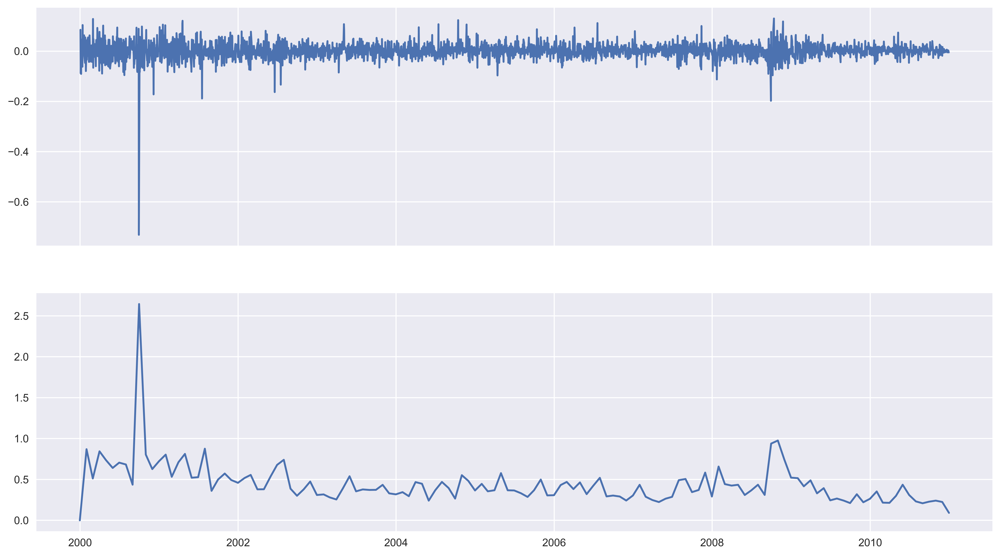

In [56]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(df.log_rtn)
ax[1].plot(df_rv.rv)

Visualizing time series data

In [62]:
import pandas as pd
import yfinance as yf

df = yf.download('MSFT', auto_adjust=False, progress=False)
df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

In [64]:
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close / df.adj_close.shift(1))

df.dropna(how = 'any', inplace = True)

In [71]:
fig, ax = plt.subplots(3, 1, figsize=(24, 30), sharex=False)

df.adj_close.plot(ax=ax[0])
ax[0].set(title = 'MSFT time series',
         ylabel = 'Stock price ($)')
df.simple_rtn.plot(ax=ax[1])
ax[1].set(ylabel = 'Simple returen (%)')

df.log_rtn.plot(ax=ax[2])
ax[2].set(xlabel = 'Date',
         ylabel = 'Log returns (%)')

[Text(0, 0.5, 'Log returns (%)'), Text(0.5, 0, 'Date')]

In [75]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

# cf.set_config_file(world_readable=True, theme='pearl', offline=True)

init_notebook_mode()

In [76]:
df.iplot(subplots=True, shape=(3,1), shared_xaxes=True,
        title='MSFT time series')